In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import os
import cv2 as cv
import xml.etree.ElementTree as et

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train_imgs = "/kaggle/input/fruit-images-for-object-detection/train_zip/train"  # this directory contains training images

In [ ]:
images_names = []  # actual images
xml_names = []  # information about the bounding box vectors

for name in os.listdir(train_imgs):
    if name.endswith("xml"):
        xml_names.append(name)
    else:
        images_names.append(name)

In [ ]:
df = {
    "name" : [],
    "height" : [],
    "width" : [],
    "label" : [],
    "xmin" : [],
    "xmax" : [],
    "ymin" : [],
    "ymax" : []
}


In [ ]:
for file in xml_names:

    tree = et.parse(os.path.join(train_imgs,file))
    root = tree.getroot()

    size = root.find("size")
    h = float(size.find("height").text)
    w = float(size.find("width").text)

    name = file.split('.')[0]

    objs = root.findall("object")

    for object in objs:  # same image may have multiple objects
        label = object.find("name").text

        bndbox = object.find("bndbox")
        xmin = bndbox.find("xmin").text
        xmax = bndbox.find("xmax").text
        ymin = bndbox.find("ymin").text
        ymax = bndbox.find("ymax").text

        df['name'].append(name)
        df['height'].append(h)
        df['width'].append(w)
        df['label'].append(label)
        df['xmin'].append(float(xmin))
        df['xmax'].append(float(xmax))
        df['ymin'].append(float(ymin))
        df['ymax'].append(float(ymax))
#         print(h,w,name,label,xmin,xmax,ymin,ymax)

In [ ]:
df = pd.DataFrame(df)

In [ ]:
df.head()

,name,height,width,label,xmin,xmax,ymin,ymax
0,apple_28,0.0,0.0,apple,25.0,275.0,42.0,297.0
1,orange_22,0.0,0.0,orange,75.0,531.0,96.0,465.0
2,apple_65,600.0,800.0,apple,70.0,290.0,25.0,226.0
3,apple_65,600.0,800.0,apple,35.0,253.0,217.0,453.0
4,apple_65,600.0,800.0,apple,183.0,382.0,177.0,411.0


In [ ]:
df.shape

(465, 8)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 465 entries, 0 to 464
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   name    465 non-null    object 
 1   height  465 non-null    float64
 2   width   465 non-null    float64
 3   label   465 non-null    object 
 4   xmin    465 non-null    float64
 5   xmax    465 non-null    float64
 6   ymin    465 non-null    float64
 7   ymax    465 non-null    float64
dtypes: float64(6), object(2)
memory usage: 29.2+ KB


In [ ]:
df['name'].value_counts()

name
mixed_17     9
apple_65     8
apple_52     8
apple_46     7
orange_1     7
            ..
orange_30    1
orange_47    1
apple_16     1
apple_12     1
banana_57    1
Name: count, Length: 240, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train_img_names, val_img_names = train_test_split(images_names,test_size=0.2)

In [ ]:
len(train_img_names), len(val_img_names)

(192, 48)

In [ ]:
HEIGHT = 480
WIDTH = 640

In [ ]:
def copy(source,destination):
    for image in source:
        if image.endswith("xml"):
            continue
        img = cv.imread(os.path.join(train_imgs,image))
        img = cv.resize(img,(WIDTH,HEIGHT))
        img = cv.cvtColor(img,cv.COLOR_BGR2RGB)

        des = os.path.join(destination,image)

        cv.imwrite(des,img)

In [ ]:
# copy(train_img_names,train_img_dir)
# copy(val_img_names, val_img_dir)

In [ ]:
classes = {
    "apple" : 0,
    "banana" : 1,
    "orange" : 2
}

In [ ]:
df['class'] = df['label'].map(classes)

In [ ]:
# scaling according to our height and width

df['xmin'] = ((df['xmin'] * WIDTH) / df['width']).round(2)
df['xmax'] = ((df['xmax'] * WIDTH) / df['width']).round(2)

df['ymin'] = ((df['ymin'] * HEIGHT) / df['height']).round(2)
df['ymax'] = ((df['ymax'] * HEIGHT) / df['height']).round(2)

In [ ]:
# finding center of box

df['x_centre'] = ((df['xmax'] + df['xmin']) / 2).round(2)
df['y_centre'] = ((df['ymax'] + df['ymin']) / 2).round(2)

In [ ]:
# height and widht of box

df['width'] = (df['xmax'] - df['xmin']).round(2)
df['height'] = (df['ymax'] - df['ymin']).round(2)

In [ ]:
df['x_centre'] = df['x_centre'] / WIDTH
df['y_centre'] = df['y_centre'] / HEIGHT
df['width'] = df['width'] / WIDTH
df['height'] = df['height'] / HEIGHT

In [ ]:
df.replace([np.inf, -np.inf],np.nan,inplace=True)

In [ ]:
df.dropna(inplace=True)

In [ ]:
df.shape

(420, 11)

In [ ]:
df = df.astype(str)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 420 entries, 2 to 464
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   name      420 non-null    object
 1   height    420 non-null    object
 2   width     420 non-null    object
 3   label     420 non-null    object
 4   xmin      420 non-null    object
 5   xmax      420 non-null    object
 6   ymin      420 non-null    object
 7   ymax      420 non-null    object
 8   class     420 non-null    object
 9   x_centre  420 non-null    object
 10  y_centre  420 non-null    object
dtypes: object(11)
memory usage: 39.4+ KB


In [ ]:
def copylabels(source,destination):
    for file in source:
        name = file.split('.')[0]

        data = df[df['name'] == name]

        bndbox = []
        for i in range(data.shape[0]):
            row = data.iloc[i]

            bndbox.append(row['class']+" "+row['x_centre']+" "+row['y_centre']+" "+ row['width']+" "+row['height'])

        text = "\n".join(bndbox)

#         print(text)
        with open(f"{destination}/{name}.txt", "w") as f:
            f.write(text)

In [ ]:
# copylabels(train_img_dir,train_label_dir)
# copylabels(val_img_dir,val_label_dir)

In [15]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 16725, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (41/41), done.
remote: Total 16725 (delta 12), reused 17 (delta 5), pack-reused 16679
Receiving objects: 100% (16725/16725), 15.31 MiB | 9.02 MiB/s, done.
Resolving deltas: 100% (11491/11491), done.
/content/yolov5


### stop here if you dont want to train model and go to last section

In [ ]:
os.chdir('/kaggle/working')
os.mkdir('/kaggle/working/yolov5/data/train')
os.mkdir('/kaggle/working/yolov5/data/val')
os.mkdir('/kaggle/working/yolov5/data/train/images')
os.mkdir('/kaggle/working/yolov5/data/train/labels')
os.mkdir('/kaggle/working/yolov5/data/val/images')
os.mkdir('/kaggle/working/yolov5/data/val/labels')

In [ ]:
copy(train_img_names, "/kaggle/working/yolov5/data/train/images")
copy(val_img_names, "/kaggle/working/yolov5/data/val/images")

libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


In [ ]:
copylabels(train_img_names, "/kaggle/working/yolov5/data/train/labels")
copylabels(val_img_names, "/kaggle/working/yolov5/data/val/labels")

In [ ]:
data_yaml = """train: /kaggle/working/yolov5/data/train/images
val: /kaggle/working/yolov5/data/val/images

nc: 3
names: ['apple','banana','orange']"""

with open("/kaggle/working/yolov5/data/data.yaml",'w') as f:
    f.write(data_yaml)

In [ ]:
with open('/kaggle/working/yolov5/data/data.yaml') as f:
    print(f.read())

train: /kaggle/working/yolov5/data/train/images
val: /kaggle/working/yolov5/data/val/images

nc: 3
names: ['apple','banana','orange']


In [ ]:
!python /kaggle/working/yolov5/train.py --img 640 --epochs 50 --batch 32 --data /kaggle/working/yolov5/data/data.yaml --cfg /kaggle/working/yolov5/models/yolov5s.yaml --weights yolov5s.pt --name fruit_detection_yolov5

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-06-23 09:20:53.475700: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-23 09:20:53.475798: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-23 09:20:53.614703: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train:

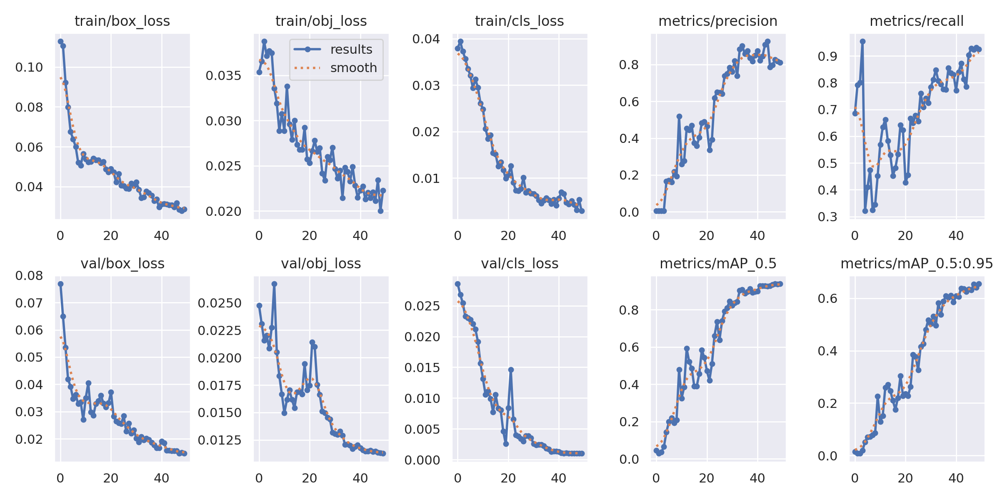

In [ ]:
from IPython.display import Image
Image(filename='/kaggle/working/yolov5/runs/train/fruit_detection_yolov5/results.png')

In [ ]:
!python /kaggle/working/yolov5/detect.py --weights /kaggle/working/yolov5/runs/train/fruit_detection_yolov5/weights/best.pt --img 640 --source /kaggle/working/yolov5/data/val/images

detect: weights=['/kaggle/working/yolov5/runs/train/fruit_detection_yolov5/weights/best.pt'], source=/kaggle/working/yolov5/data/val/images, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-331-gab364c98 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/48 /kaggle/working/yolov5/data/val/images/apple_16.jpg: 480x640 1 apple, 43.2ms
image 2/48 /kaggle/working/yolov5/data/val/images/apple_21.jpg: 480x640 2 apples, 6.3ms
image 3/48 /kaggle/working/yolov5/data/val/images/apple_22.jpg: 480x64

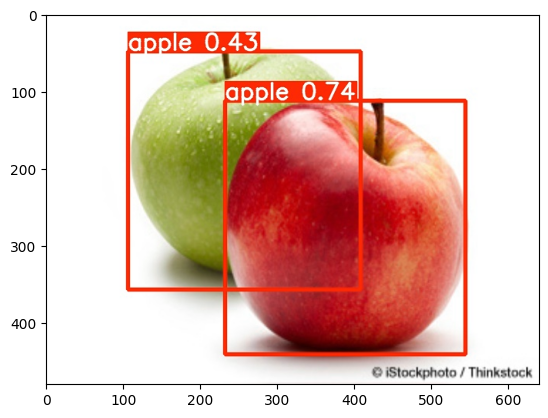

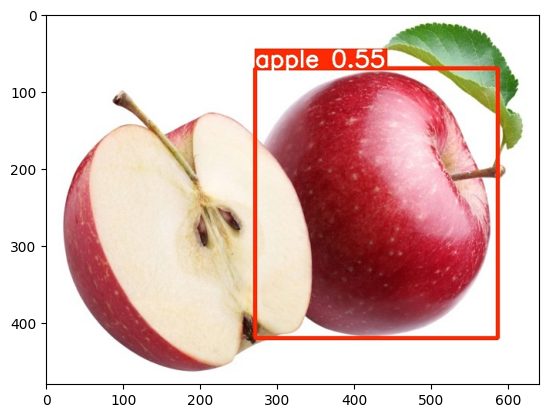

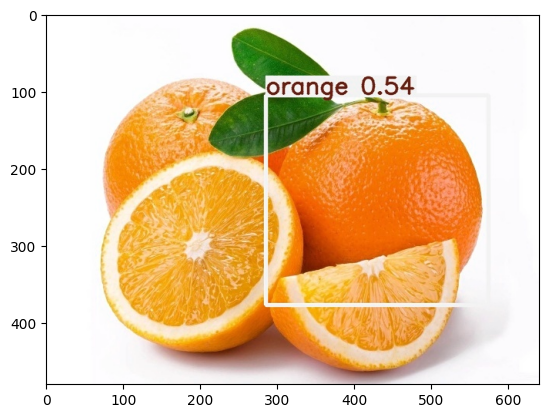

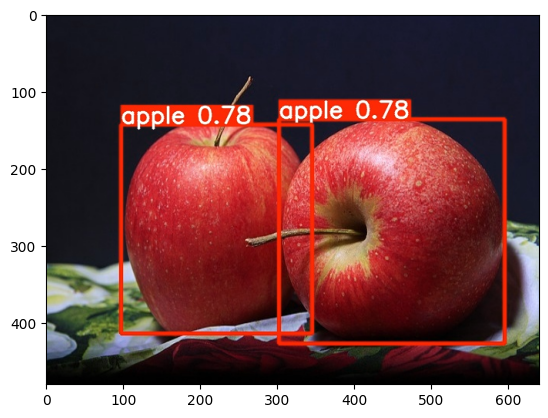

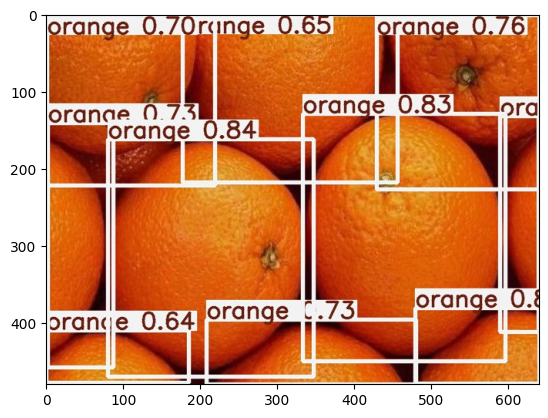

In [ ]:
for i in os.listdir("/kaggle/working/yolov5/runs/detect/exp")[:5]:
    path = os.path.join("/kaggle/working/yolov5/runs/detect/exp",i)

    img = cv.imread(path)
#     img = cv.cvtColor(img,cv.COLOR_BGR2RGB)

    plt.imshow(img)
    plt.show()

In [ ]:
# for testing
try:
    os.chdir("/kaggle/working")
    os.mkdir("/kaggle/working/test")
except:
    pass

for i in os.listdir("/kaggle/input/fruit-images-for-object-detection/test_zip/test"):
    if i.endswith("xml"):
        continue

#     name = i.split('.')[0]
    path = os.path.join("/kaggle/input/fruit-images-for-object-detection/test_zip/test",i)

    img = cv.imread(path)
    img = cv.resize(img,(640,480))
    img = cv.cvtColor(img,cv.COLOR_BGR2RGB)

    cv.imwrite(f"/kaggle/working/test/{i}",img)

libpng warning: iCCP: known incorrect sRGB profile


In [ ]:
!python /kaggle/working/yolov5/detect.py --weights /kaggle/working/yolov5/runs/train/fruit_detection_yolov5/weights/best.pt --img 640 --source /kaggle/working/test

detect: weights=['/kaggle/working/yolov5/runs/train/fruit_detection_yolov5/weights/best.pt'], source=/kaggle/working/test, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-331-gab364c98 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/60 /kaggle/working/test/apple_77.jpg: 480x640 6 apples, 44.1ms
image 2/60 /kaggle/working/test/apple_78.jpg: 480x640 1 apple, 6.0ms
image 3/60 /kaggle/working/test/apple_79.jpg: 480x640 1 apple, 5.6ms
image 4/60 /kaggle/working/test/apple_80.jpg: 480x640 1

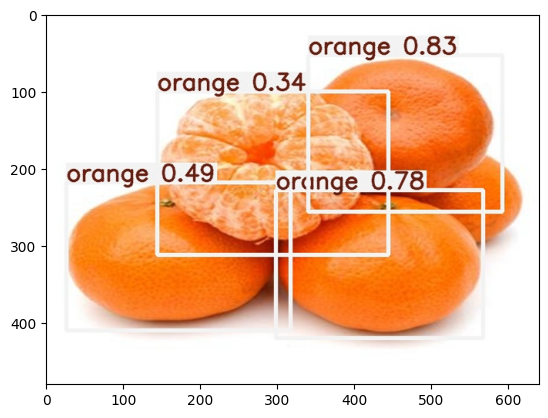

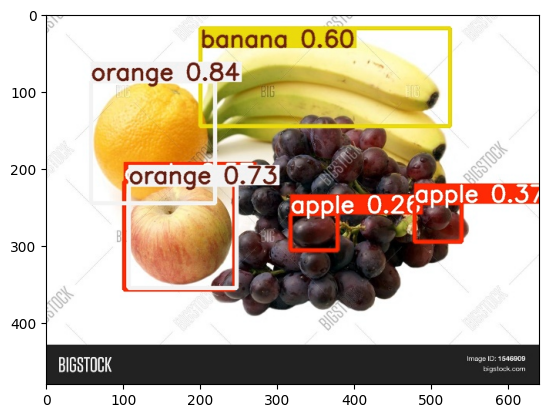

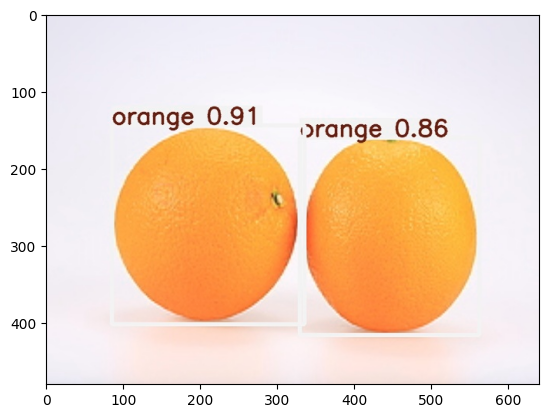

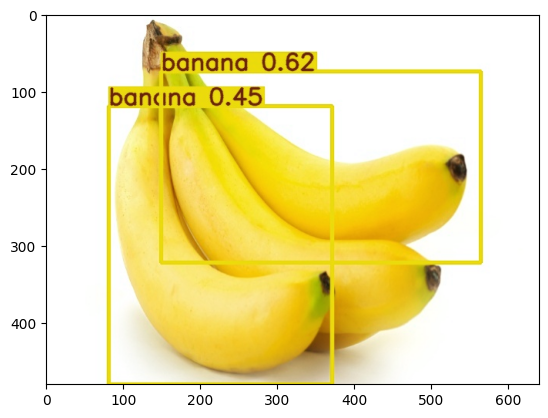

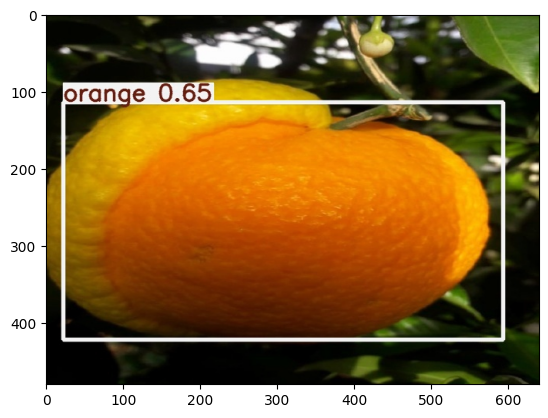

...

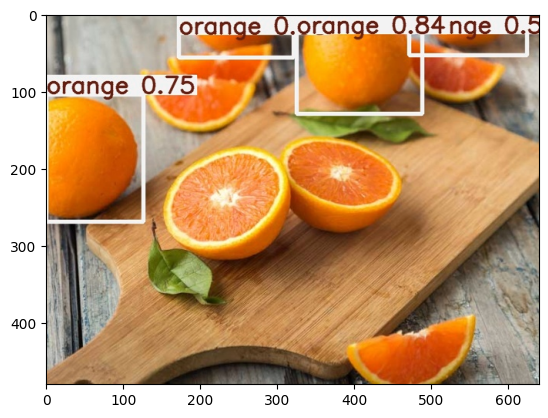

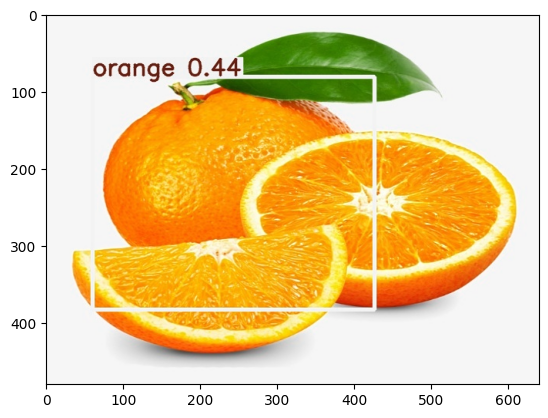

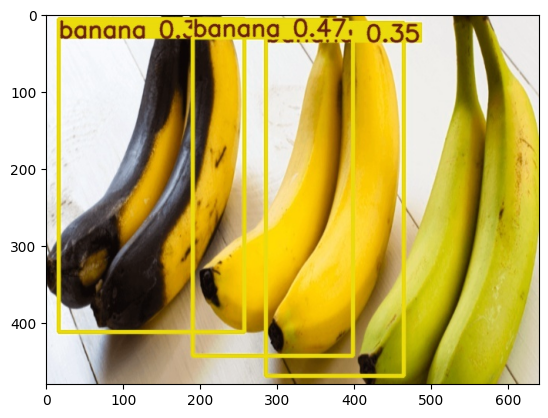

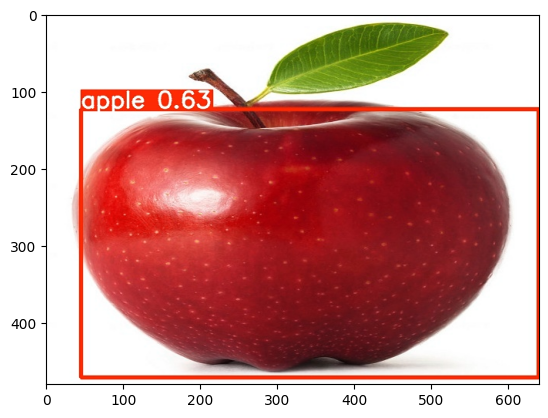

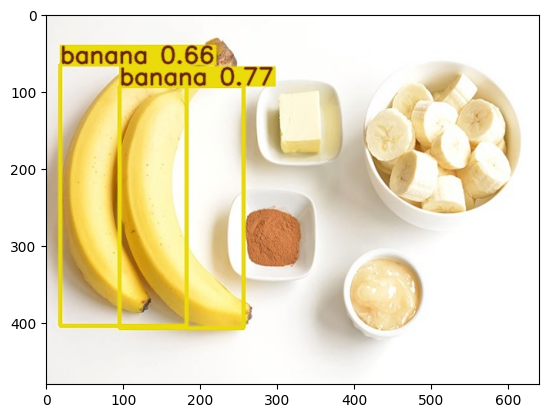

In [ ]:
for i in os.listdir("/kaggle/working/yolov5/runs/detect/exp2"):
    path = os.path.join("/kaggle/working/yolov5/runs/detect/exp2",i)

    img = cv.imread(path)
#     img = cv.cvtColor(img,cv.COLOR_BGR2RGB)

    plt.imshow(img)
    plt.show()

In [ ]:
import zipfile

def zip_folder(folder_path, output_zip):
    with zipfile.ZipFile(output_zip, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through all the files and folders in the given directory
        for root, _, files in os.walk(folder_path):
            for file in files:
                # Create complete file path
                file_path = os.path.join(root, file)
                # Add file to zip
                zipf.write(file_path, os.path.relpath(file_path, folder_path))

# Example usage:
folder_to_zip = '/kaggle/working/yolov5'
output_zip_file = '/kaggle/working/yolov5.zip'

zip_folder(folder_to_zip, output_zip_file)

In [ ]:
# def clean_directory(directory):
#     # Check if the directory exists
#     if not os.path.exists(directory):
#         print(f"The directory {directory} does not exist.")
#         return

#     # List all files and subdirectories in the directory
#     for filename in os.listdir(directory):
#         file_path = os.path.join(directory, filename)

#         try:
#             if os.path.isfile(file_path) or os.path.islink(file_path):
#                 # Remove the file or symbolic link
#                 os.unlink(file_path)
#             elif os.path.isdir(file_path):
#                 # Remove the directory and all its contents
#                 shutil.rmtree(file_path)
#         except Exception as e:
#             print(f"Failed to delete {file_path}. Reason: {e}")

# # Example usage
# directory_to_clean = '/kaggle/working/Data/train/labels'  # Replace with your directory
# clean_directory(directory_to_clean)

### another way of yolo


In [ ]:
!pip install ultralytics

In [ ]:
from ultralytics import YOLO

In [ ]:
model = YOLO('yolov5nu.pt')
model.train(data = '/kaggle/working/yolov5/data/data.yaml',epochs = 20 , imgsz = 128 )  # you need to have wandb api key

Ultralytics YOLOv8.2.39 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov5nu.pt, data=/kaggle/working/yolov5/data/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=128, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

2024-06-23 09:59:55,891	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-06-23 09:59:56,620	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1      1760  ultralytics.nn.modules.conv.Conv             [3, 16, 6, 2, 2]              
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      4800  ultralytics.nn.modules.block.C3              [32, 32, 1]                   
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     29184  ultralytics.nn.modules.block.C3              [64, 64, 2]                   
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  3    156928  ultralytics.nn.modules.block.C3              [128, 128, 3]                 
  7                  -1  1    295424  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

### run from here for testing

In [18]:
import shutil

def copy_directory(source, destination):
    try:
        shutil.copytree(source, destination)
        print(f"Directory copied successfully from {source} to {destination}")
    except OSError as e:
        print(f"Error: {e}")

# Example usage:
source_dir = '/content/drive/MyDrive/runs'  # path runs file (present in my repo)
destination_dir = '/content/yolov5/runs'

copy_directory(source_dir, destination_dir)


Directory copied successfully from /content/drive/MyDrive/runs to /content/yolov5/runs


In [ ]:
!pip install ultralytics

In [25]:
!pip install dill

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 2.8 MB/s eta 0:00:00


In [7]:
import ultralytics

In [29]:
import subprocess

def predict(source, exp_name="exp"):
    try:
        # Construct the command
        command = [
            "python", "/content/yolov5/detect.py",
            "--weights", "/content/yolov5/runs/train/fruit_detection_yolov5/weights/best.pt",
            "--img", "640",
            "--source", source,
            "--name", exp_name
        ]

        # Run the command
        result = subprocess.run(command, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)

        # Print the output
        print(result.stdout)

    except subprocess.CalledProcessError as e:
        # Print the error output
        print(f"Error: {e.stderr}")

In [30]:
predict("/content/drive/MyDrive/test") # PATH OF DIRECTORY WITH IMAGES